### **Cycle-GAN**

This is an implementation of Cycle-GAN, based on an online tutorial found at https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cyclegan.ipynb. The changes made to the code are as follows:

1. Modify the implementation to go from photo -> Monet rather than Monet -> photo
2. Tune the Adam Optimiser as desired, and as supported by my literature review.
3. Introduce an additional technique, random erasing, as an image augmentation technique to further prevent overfitting.
3. Modify the number of epochs used for training.
3. Introduce the Learned Perceptual Image Patch Similarity (LPIPS) as a quantitative measure of the success of style transfer. Write additional code to ensure the tensor sizes are equivalent in order to compare the input and output images.

In [ ]:
# install tensorflow examples
!pip install git+https://github.com/tensorflow/examples.git

In [3]:
import tensorflow as tf

In [4]:
# import all libraries
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

AUTOTUNE = tf.data.AUTOTUNE

In [5]:
# get Monet dataset (trainA=photo, trainB=monet) -> this was done as we are doing photo->monet, not monet->photo
dataset, metadata = tfds.load('cycle_gan/monet2photo',
                              with_info=True, as_supervised=True)

train_photos, train_monet = dataset['trainB'], dataset['trainA']
test_photos, test_monet = dataset['testB'], dataset['testA']

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/monet2photo/2.0.0.incompleteTEJN4T/cycle_gan-trainA.tfrecord


  0%|          | 0/1072 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/monet2photo/2.0.0.incompleteTEJN4T/cycle_gan-trainB.tfrecord


  0%|          | 0/6287 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/monet2photo/2.0.0.incompleteTEJN4T/cycle_gan-testA.tfrecord


  0%|          | 0/121 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cycle_gan/monet2photo/2.0.0.incompleteTEJN4T/cycle_gan-testB.tfrecord


  0%|          | 0/751 [00:00<?, ? examples/s]

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/monet2photo/2.0.0. Subsequent calls will reuse this data.


In [6]:
# buffer and batch sizes set, will only use images of 256x256
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [7]:
# image augmentation - random cropping used
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

In [8]:
# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

In [9]:
def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  
  # random saturation - uncomment when tuning Cycle-GAN
  # image = tf.image.random_saturation(image)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

In [10]:
def preprocess_image_train(image, label):
  image = random_jitter(image)
  image = normalize(image)
  return image

In [11]:
def preprocess_image_test(image, label):
  image = normalize(image)
  return image

In [12]:
train_photos = train_photos.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

train_monet = train_monet.cache().map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_photos = test_photos.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_monet = test_monet.map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).cache().shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

In [13]:
# get samples for training
sample_photo = next(iter(train_photos))
sample_monet = next(iter(train_monet))

In [ ]:
# plot photos after random jitter/cropping (+saturation) is applied
plt.subplot(121)
plt.title('Photo')
plt.imshow(sample_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Photo augmented')
plt.imshow(random_jitter(sample_photo[0]) * 0.5 + 0.5)

In [ ]:
plt.subplot(121)
plt.title('Monet')
plt.imshow(sample_monet[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Monet augmented')
plt.imshow(random_jitter(sample_monet[0]) * 0.5 + 0.5)

In [16]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

In [ ]:
to_monet = generator_g(sample_photo)
to_photo = generator_f(sample_monet)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_photo, to_monet, sample_monet, to_photo]
title = ['Photo', 'To Monet', 'Monet', 'To Photo']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

In [ ]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a real Monet?')
plt.imshow(discriminator_y(sample_monet)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a real photo?')
plt.imshow(discriminator_x(sample_photo)[0, ..., -1], cmap='RdBu_r')

plt.show()

In [19]:
# set LAMBDA value
LAMBDA = 10

In [20]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [21]:
# loss functions - calculate generator and discriminator losses

def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [22]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

In [23]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  
  return LAMBDA * loss1

In [24]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

In [25]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5) # Optional - epsilon = 1e-7 (tuned)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

Adam optimizer will be tuned here: learning rate was 2e-4, had beta_1=0.5

Old and new hyperparameters shown below

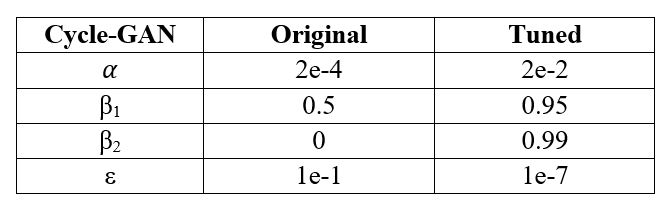


See paper for justification

In [26]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

In [27]:
# We train the model for 30 epochs - this takes approximately 2 hours
EPOCHS = 30

In [28]:
def generate_images(model, test_input):
  prediction = model(test_input)
    
  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [29]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)
    
    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    
    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
  
  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)
  
  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))
  
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

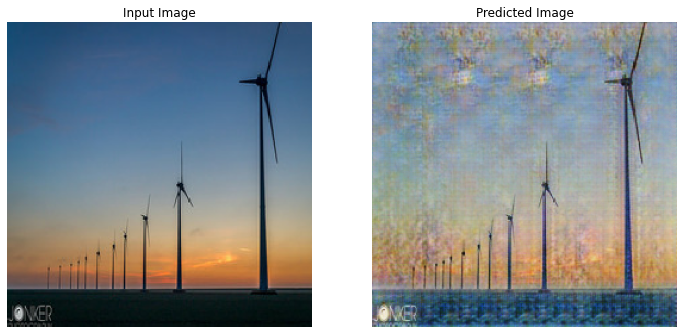

Saving checkpoint for epoch 30 at ./checkpoints/train/ckpt-6
Time taken for epoch 30 is 244.62795233726501 sec



In [31]:
for epoch in range(30):
  start = time.time()

  n = 0
  for image_x, image_y in tf.data.Dataset.zip((train_photos, train_monet)):
    train_step(image_x, image_y)
    if n % 10 == 0:
      print ('.', end='')
    n += 1

  clear_output(wait=True)
  # Using a consistent image (sample_photo) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_photo)

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

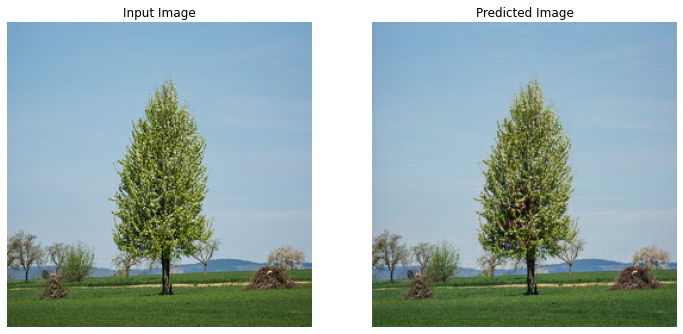

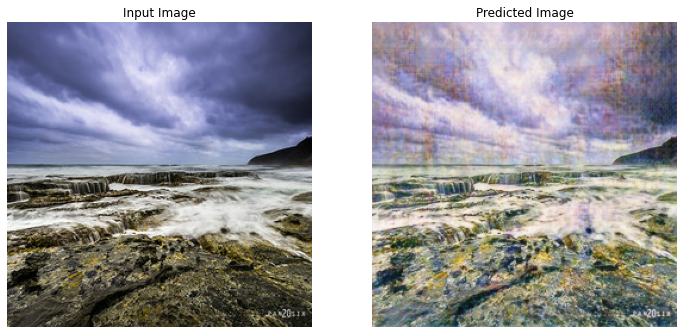

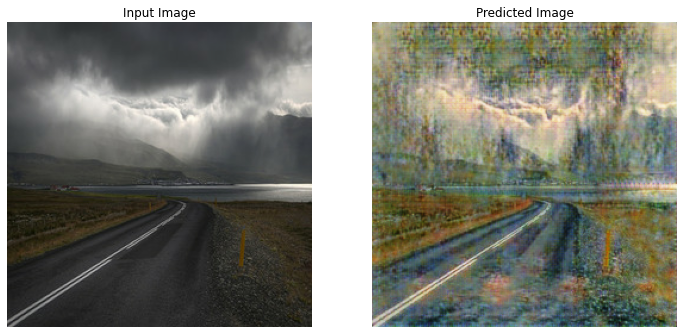

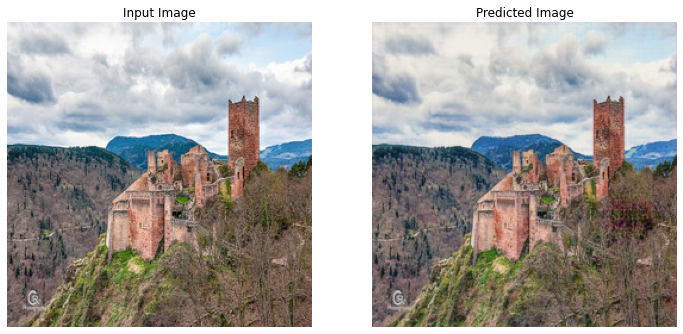

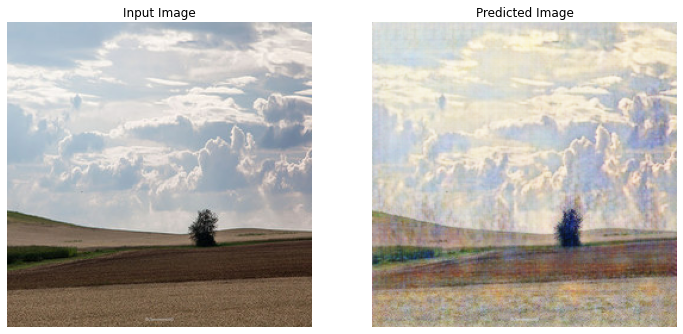

...

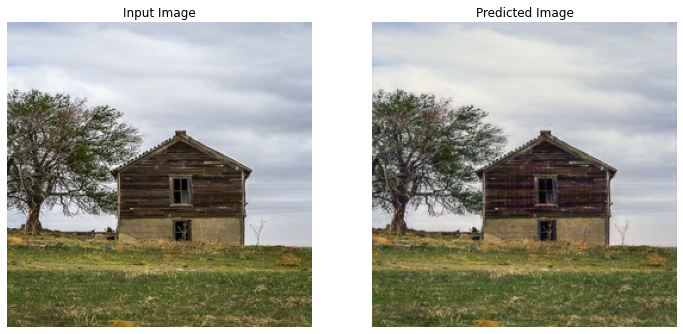

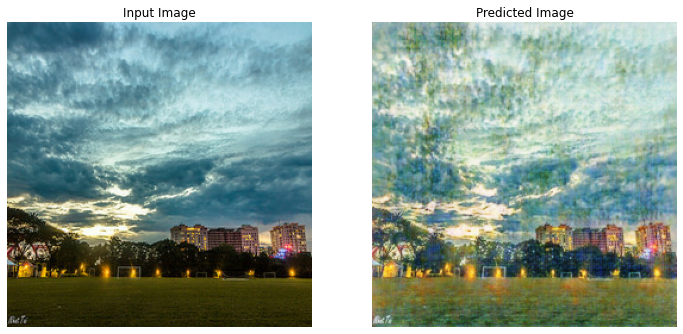

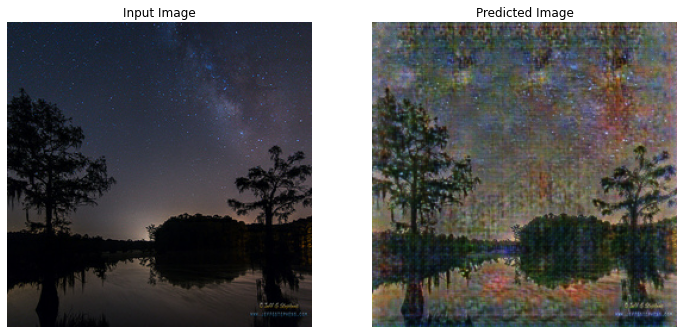

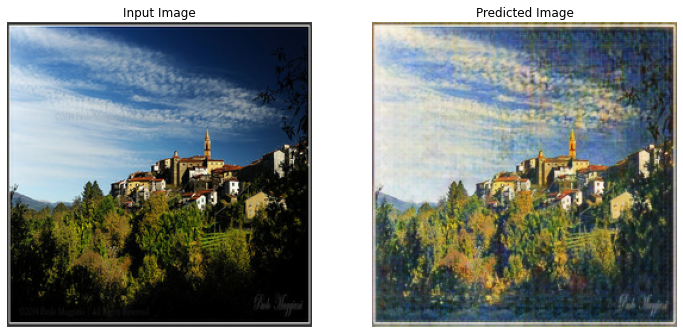

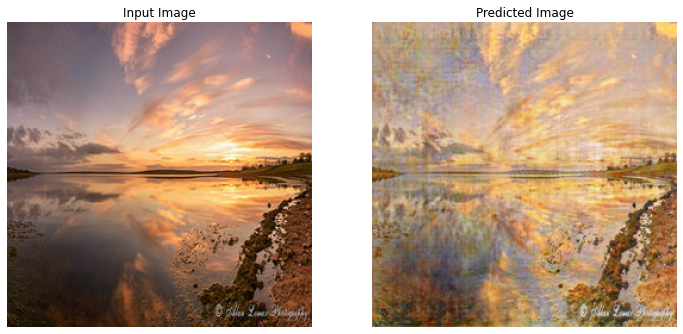

In [32]:
# Run the trained model on the test dataset - take 30 images from dataset, can modify this to generate 
# as many as you'd like
for inp in test_photos.take(30):
  generate_images(generator_g, inp)

**Instructions to calculate perceptual distance given an input and output image**

1. Run the two lines of code below to create a Perceptual Distance directory.
2. Save the input image and predicted image to your desktop using the Snipping Tool, then upload them to the Perceptual Similarity directory. Give the images memorable names e.g. trees_output.jpg. When selecting from the 30 tests shown above, pick the pairs that you like the most.
2. Run the code to convert the images to the correct size, then save the image with a memorable name
3. Pass the images into the convert('RGB') function - use the images you have saved in Step 2
4. Pass the content path of each image into the line of code that calculates perceptual distance. If the process is repeated for another content/style pair, the paths of each image need to be updated

In [2]:
# clone repo for perceptual distance
!git clone https://github.com/richzhang/PerceptualSimilarity

Cloning into 'PerceptualSimilarity'...
remote: Enumerating objects: 778, done.
remote: Counting objects: 100% (47/47), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 778 (delta 24), reused 27 (delta 12), pack-reused 731
Receiving objects: 100% (778/778), 8.76 MiB | 15.65 MiB/s, done.
Resolving deltas: 100% (455/455), done.


In [3]:
# change directory
%cd PerceptualSimilarity/

/content/PerceptualSimilarity


Code below is based on this Stack Overflow article - ensures that images being used to calculate perceptual distance were of the same size. Note that the same code is used in Neural Style Transfer.

https://stackoverflow.com/questions/47929557/tensorflow-cnn-training-images-are-all-different-sizes

In [4]:
# Run this code (step 3) to convert the images to the correct size

from PIL import Image

basewidth = 28 # MNIST image width
img = Image.open('/content/PerceptualSimilarity/input.JPG') # make sure to use the correct image path, see instructions 
# in step 5 to copy an image path
wpercent = (basewidth/float(img.size[0]))
hsize = int((float(img.size[1])*float(wpercent)))
img = img.resize((1000,800), Image.ANTIALIAS)

# Save image
img.save('input.JPG') 

In [5]:
from PIL import Image

basewidth = 28 # MNIST image width
img = Image.open('/content/PerceptualSimilarity/output.JPG')
wpercent = (basewidth/float(img.size[0]))
hsize = int((float(img.size[1])*float(wpercent)))
img = img.resize((1000,800), Image.ANTIALIAS)

# Save image
img.save('output.JPG')

In [ ]:
# need to convert these images to RGB to get the perceptual distance

In [6]:
# step 4
input1 = Image.open('/content/PerceptualSimilarity/input.JPG').convert('RGB')
output1 = Image.open('/content/PerceptualSimilarity/output.JPG').convert('RGB')

Example for step 5

`!python lpips_2imgs.py -p0 /path-to-content-image -p1 /path-to-style-image`

To get the path to an image, click on the image in the directory, then click on the dots on the far-right, then click copy path.

In [7]:
# step 5
# get perceptual distance (p0 = original image, p1 = output) -> perceptual distance should be between 0 and 1
!python lpips_2imgs.py -p0 /content/PerceptualSimilarity/input.JPG -p1 /content/PerceptualSimilarity/output.JPG

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100% 233M/233M [00:01<00:00, 169MB/s]
Loading model from: /content/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Distance: 0.478
